In [57]:
import pandas as pd
pd.options.display.float_format = '{:.2f}'.format
import numpy as np

import warnings
warnings.filterwarnings("ignore")

import MyCustomLibrary.main as main

## Research

#### Hours Seasonality - BINANCE DATA 08/2017 - 01/2026

In [58]:
from MyCustomLibrary.data import BTC_Hourly

quotes_hourly = BTC_Hourly.droplevel(level=0, axis=1)
quotes_hourly

,Open,High,Low,Close,Volume
Timestamp,,,,,
2017-08-17 04:00:00,4261.48,4313.62,4261.32,4308.83,47.18
2017-08-17 05:00:00,4308.83,4328.69,4291.37,4315.32,23.23
2017-08-17 06:00:00,4330.29,4345.45,4309.37,4324.35,7.23
2017-08-17 07:00:00,4316.62,4349.99,4287.41,4349.99,4.44
2017-08-17 08:00:00,4333.32,4377.85,4333.32,4360.69,0.97
...,...,...,...,...,...
2026-01-30 05:00:00,82938.92,83329.36,82903.23,82914.19,818.21
2026-01-30 06:00:00,82914.20,82919.21,82056.08,82602.81,1199.37
2026-01-30 07:00:00,82602.81,83100.00,82483.27,82816.98,1624.46


In [59]:
hourly_seasonality = main.get_seasonality(quotes_hourly.loc[:, 'Close'], timeframe='H')
hourly_seasonality

,avg. return (%)
hour,
0,0.01
1,-0.02
2,-0.02
3,-0.02
4,-0.01
5,0.00
6,0.02
7,0.01
8,0.00


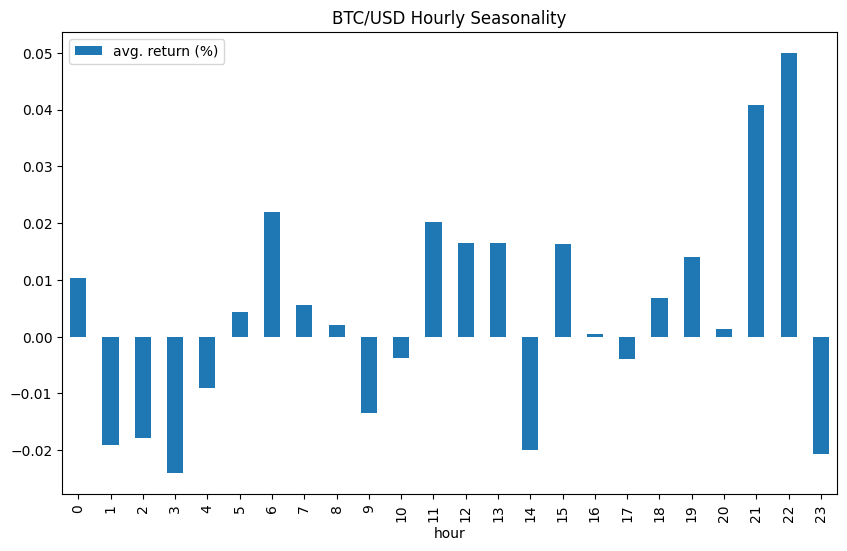

In [60]:
hourly_seasonality.plot.bar(figsize=(10,6), title='BTC/USD Hourly Seasonality');

A possible explanation for this abnormal deviation is given by "The Seasonality of Bitcoin" paper stating that these are the hours that no big traditional markets Exchange is open.

    "All major markets are closed during this period of the day. For UTC +0, the NYSE 
    is open between 14:30 and 21:00, Tokyo Stock Exchange is open from 00:00 to 06:00, Hong 
    Kong from 01:30 to 08:00, same as India, which is open between 2:30 and 10:00, and Australia,
    which is open from 23:00 to 05:00. Both London and continental Europe are closed during these 
    hours since it is night there. Therefore, the best time to trade (and hold) BTC is when every 
    other major exchange is closed. "

# So let's Backtest this theory


Since we are aiming to get exposure at the 22nd hour, we should get in at 22:00H and exit at 23:00H.

In [61]:
import MyCustomLibrary.backtester as bt
import MyCustomLibrary.backtester_tools as tools

class SeasonalityStrategy(bt.Strategy):
    
    def init(self,
             **kwargs
             ):
        
        self.symbol = 'BTCUSDT'

    def next(self, i, record):

        timestamp = self.data.index[i]
        try:
            if timestamp.hour == 22:
            ###########################################
            ###          Buy conditions             ###
            ###########################################

            #if not self.has_position(self.open_positions, self.symbol):
                self.open_long(symbol = self.symbol, price = record['Open'])
            
            
            elif timestamp.hour == 23:
            ###########################################
            ###          Sell conditions            ###
            ###########################################
            #if self.has_position(self.open_positions, self.symbol):
                self.close(symbol=self.symbol, price=record['Open'])

                
                    
        except Exception as e:
            import traceback
            print(traceback.format_exc())

## In Sample Testing

In [62]:
df_train, df_test = main.train_test_split(quotes_hourly, test_size=0.2)

main.timer.start()
backtest = bt.Backtest(SeasonalityStrategy, df_train, df_train.loc[:, 'Close'], cash=100_000, commission=0.0)
result = backtest.run()
main.timer.stop()


[*] Total runtime: 475.33 ms


In [63]:
tools.strategy_performance_metrics(pd.concat([result.returns, result.benchmark], axis=1), steps_per_year=(365*24))

,Strategy Backtest,Benchmark
CAGR %,19.77,47.29
Ann. Vola %,15.55,78.16
Max Drawdown %,-16.91,-83.91
VaR 5%,0.00,-1.10
Time in Market %,7.23,99.95
Sharpe,1.27,0.61
Sortino,0.40,0.73
Calmar,1.17,0.56
Efficiency,2.73,0.47


    Strategy has returned ~20% annualized vs B&H ~47%, with much lower annualized volatility (15.5% vs 78%) and also much lower MDD (-17% vs -84%). This reduced volatility and MDD justify how ratios like Sharpe Ratio and Calmar ratio are more than double vs B&H.

    The biggest advantage of this strategy is being able to extract 20% annualized returns being exposed only 7% of the time. Allowing capital to be used in another endeavors while is not being utilized.

In [64]:
main.plot_strategy_performance(result.returns, result.benchmark)

    Graph shows that Strategy has a smooth ride throughout the entire tested period.

In [65]:
result.trades.tail(3)

,symbol,open_date,close_date,bars_held,open_price,close_price,position_size,profit_loss,change_pct,trade_commission,cumulative_return,current_open_positions,why_exit
2501,BTCUSDT,2024-06-24 22:00:00,2024-06-24 23:00:00,1,60119.24,60048.98,5.76,-404.79,-0.12,0.00,345960.81,1,None
2502,BTCUSDT,2024-06-25 22:00:00,2024-06-25 23:00:00,1,61916.53,61909.99,5.59,-36.54,-0.01,0.00,345924.26,1,None
2503,BTCUSDT,2024-06-26 22:00:00,2024-06-26 23:00:00,1,61054.35,60924.61,5.67,-735.09,-0.21,0.00,345189.18,1,None


##### Returns Analysis

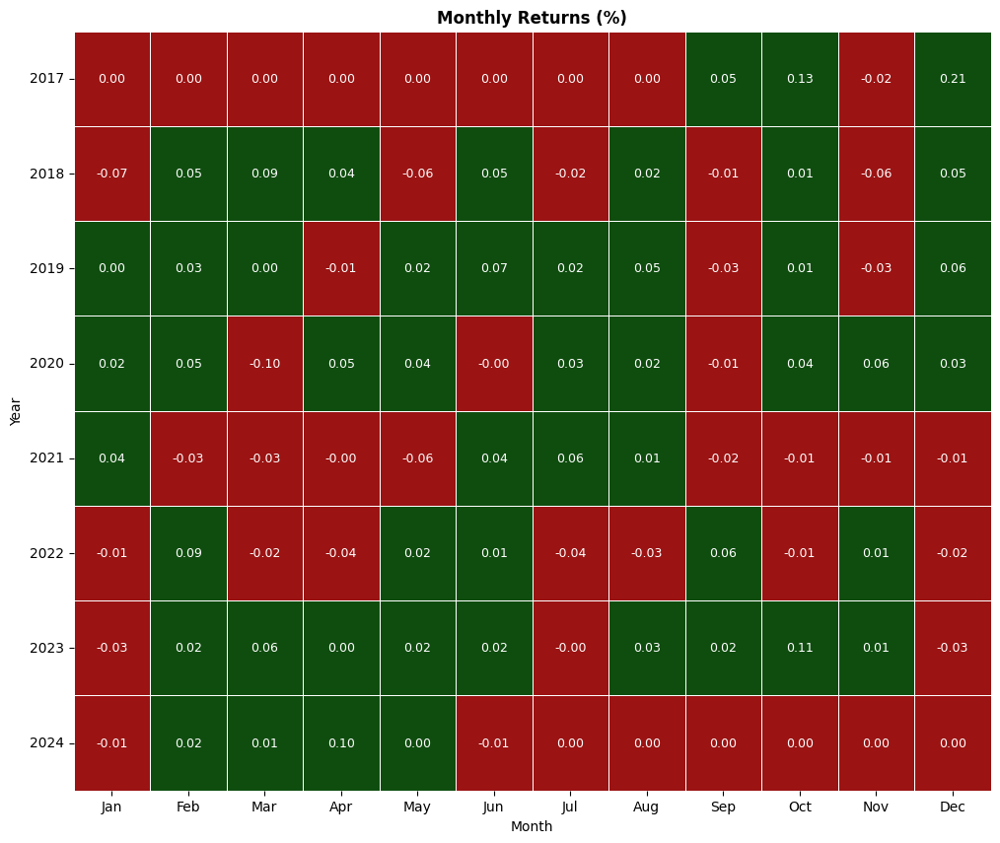

In [66]:
main.monthly_pos_neg_returns(result.returns)

### Trades Analysis

In [67]:
tools.metrics_trades(result.trades)

,Trades Analysis
Nr trades,2504.00
Win Rate %,53.27
Profit Factor,1.22
Avg. Win %,0.50
Avg. Loss %,-0.47
Reward/Risk,1.08
Expectancy %,0.05
Avg. Bars Held,1.00


    This strategy has a positive expectancy per trade, this may be the single most important metric to look at in in this table.

### Statistical Annalysis

##### Is it significantly different from 0?

In [68]:
main.compute_t_test(result.returns)

P-value: 0.0011689507003491066 Reject the null hypothesis (H₀). The strategy average return is significantly different from zero.


##### Does it pass Monte Carlo Permutation?

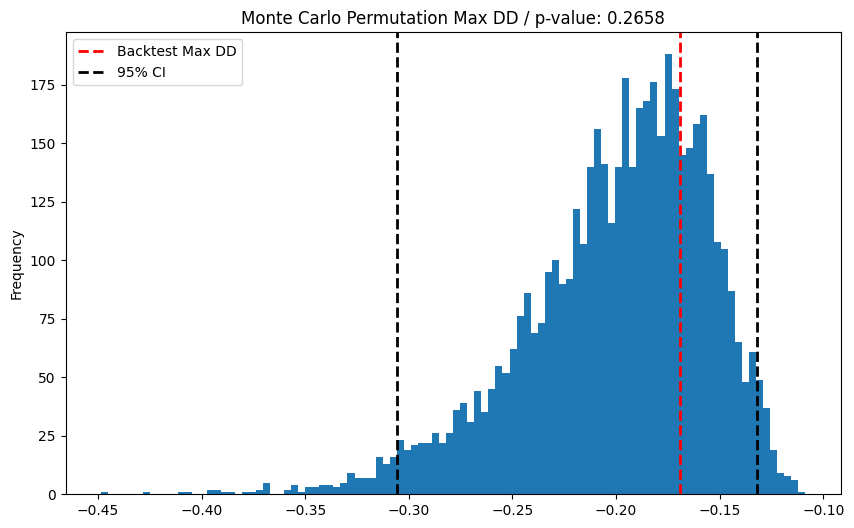

In [69]:
mcpyt = main.monte_carlo_permutation_yt(result.returns, nr_simulations=5_000)

main.mcpyt_analysis(mcpyt, result.returns)

    Statistically speaking this is not a sound strategy! Although it has proven itself against 0 returns(T Test), it has failed to pass Monte Carlo Permutation test, proving that it doesn't have an edge, since Stregy's Max DD is between Monte Carlo MDD 95% CI.

<div class="alert alert-block alert-info"><b>Final Findings:</b>

Bitcoin has shown an impressive abnormality of returns on the 22nd UTC+0 hour. The paper "The Seasonality of Bitcoin" suggests that this anomaly might be related to the moment when most large traditional exchanges historically perform operational resets or have reduced activity.

This sounded promising, so I decided to backtest the idea using an event-based backtester, [which tends to be more reliable than vectorized approaches for strategy validation](https://www.interactivebrokers.com/campus/ibkr-quant-news/a-practical-breakdown-of-vector-based-vs-event-based-backtesting/).

The first results of the strategy were quite encouraging. Although it did not outperform Buy & Hold in absolute return terms, it achieved a ~20% CAGR while being exposed to the market only about 7% of the time. Additionally, it delivered roughly double the Sharpe and Calmar ratios compared to B&H. Visually, the equity curve is also much smoother, which reinforces the idea that the strategy captures a consistent edge.

Looking deeper into the individual trades, the statistics support what the equity curve already suggests: the strategy appears profitable under the assumptions of the backtest (important to note that the analysis is conducted without costs or taxes). Both Reward/Risk and Expectancy are positive, indicating that the trade distribution is favorable and potentially robust enough to justify further investigation.

Before moving into Out-of-Sample testing, a set of statistical validation tests was performed. The T-Test confirms that the average return of the strategy is statistically different from zero. However, the strategy fails the Monte Carlo permutation test, producing a p-value of 0.27. This suggests that the observed performance could reasonably occur by chance once the temporal structure of the trades is randomized.

Given this result, despite the appealing performance metrics, the evidence is not strong enough to confidently attribute the edge to a real market inefficiency. As a result, the most prudent decision is to abandon this strategy idea and continue searching for more statistically robust signals.
</div>